# 🖼️ Old Photo Restoration & Background Removal

Complete toolkit for restoring and processing old photos with computer vision.

## Features

### 🔧 Photo Repair (OpenCV Inpainting)
- Automatic crack and damage detection
- Manual red-marking support for precise control
- Face-aware processing to preserve facial details
- Works 100% offline with no large downloads

### 🎨 AI Background Removal
- **rembg + U2-Net** pretrained model (best quality)
- OpenCV GrabCut fallback (no external dependencies)
- Export as transparent PNG or custom background colors
- Optimized models for portraits and general images

### 📝 Quick Start
1. Update `INPUT_IMAGE_NAME` in Cell 3
2. Run Cell 4 (Helpers)
3. Run Cell 5 (Photo Repair) or Cell 7 (Background Removal)


In [1]:
## 1) Environment Check

import sys
import platform

print('Python:', sys.version.split()[0])
print('Platform:', platform.system())

# Core dependencies
REQUIRED = ['numpy', 'opencv-python', 'Pillow']
# Optional for AI background removal
OPTIONAL = ['rembg', 'onnxruntime']

print('\n📦 Required:', ', '.join(REQUIRED))
print('🎁 Optional (for AI features):', ', '.join(OPTIONAL))
print('\n💡 Install optional: pip install rembg onnxruntime')


Python: 3.12.7
Platform: Windows

📦 Required: numpy, opencv-python, Pillow
🎁 Optional (for AI features): rembg, onnxruntime

💡 Install optional: pip install rembg onnxruntime


In [2]:
## 2) Project Initialization

from pathlib import Path
import sys

PROJECT_ROOT = Path(r"c:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch")
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

print(f'✓ Project root: {PROJECT_ROOT}')


✓ Project root: c:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch


In [3]:
## 3) Configuration - Image Path Settings

from pathlib import Path

# ============================================
# CHANGE YOUR IMAGE PATH HERE
# ============================================
DATA_FOLDER = Path(r"C:\Users\jashu\Downloads\Image Restoration - CV")
INPUT_IMAGE_NAME = 'High Quality1.png'  # Change this to your image filename

# Computed paths (no need to change these)
INPUT_IMAGE_PATH = DATA_FOLDER / INPUT_IMAGE_NAME
OUTPUT_FOLDER = PROJECT_ROOT / 'outputs'
MASKS_OUT = OUTPUT_FOLDER / 'masks'

# Create output directories
OUTPUT_FOLDER.mkdir(exist_ok=True)
MASKS_OUT.mkdir(exist_ok=True)

print(f'✓ Configuration set:')
print(f'  Input image: {INPUT_IMAGE_PATH}')
print(f'  Output folder: {OUTPUT_FOLDER}')
print(f'  Masks folder: {MASKS_OUT}')
print(f'\n✓ Ready to process: {INPUT_IMAGE_NAME}')

✓ Configuration set:
  Input image: C:\Users\jashu\Downloads\Image Restoration - CV\High Quality1.png
  Output folder: c:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch\outputs
  Masks folder: c:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch\outputs\masks

✓ Ready to process: High Quality1.png


In [4]:
# Helpers and convenience functions
from pathlib import Path
import os
import sys
import cv2
import numpy as np

# Try Matplotlib but fall back to PIL if unavailable
try:
    import matplotlib.pyplot as plt
except Exception:
    plt = None

try:
    from PIL import Image
    _PIL_AVAILABLE = True
except Exception:
    Image = None
    _PIL_AVAILABLE = False

# Robust project root resolution for notebooks
try:
    ROOT = Path(__file__).resolve().parent  # works when executed as a script
except NameError:
    ROOT = Path.cwd()

# If we're inside the 'notebooks' folder, project root is parent; else guess
PROJECT_ROOT = ROOT.parent if ROOT.name.lower() == 'notebooks' else (ROOT if (ROOT / 'notebooks').exists() else ROOT)

# Prefer the known workspace path if available (Windows path in this environment)
KNOWN_ROOT = Path(r"C:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch")
if KNOWN_ROOT.exists():
    PROJECT_ROOT = KNOWN_ROOT

REQUIRED = ['numpy', 'opencv-python']
OPTIONAL = ['matplotlib', 'Pillow']

print('Project root:', PROJECT_ROOT)
print('Required pkgs assumed available:', REQUIRED)
print('Optional pkgs:', OPTIONAL)


def load_bgr(path):
    img = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f'Could not read image: {path}')
    return img


def load_gray(path):
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f'Could not read image: {path}')
    return img


def bgr_to_rgb(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


def bgr_to_pil(img):
    if Image is None:
        raise RuntimeError('PIL not available')
    rgb = bgr_to_rgb(img)
    return Image.fromarray(rgb)


def resize_max_dim(img, max_dim=1200):
    h, w = img.shape[:2]
    scale = min(1.0, max_dim / float(max(h, w)))
    if scale == 1.0:
        return img
    new_w, new_h = int(w * scale), int(h * scale)
    return cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)


def show_bgr(img, title='image', figsize=(8, 6)):
    if plt is not None:
        try:
            plt.figure(figsize=figsize)
            plt.imshow(bgr_to_rgb(img))
            plt.title(title)
            plt.axis('off')
            plt.show()
            return
        except Exception as e:
            print('Matplotlib display failed, falling back to PIL:', e)
    if _PIL_AVAILABLE and Image is not None:
        display(bgr_to_pil(img))
    else:
        print('[Display skipped] Neither Matplotlib nor PIL available')


def save_bgr(path, img):
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    cv2.imwrite(str(path), img)


def extract_red_mask(bgr, hue_min=0, hue_max=10, sat_min=100, val_min=100):
    """
    Extract red-marked regions from an image (for manually marked photos).
    Red color in HSV: Hue 0-10 or 170-180 (wraps around), high saturation and value.
    Returns binary mask (0/255) where red regions are white.
    """
    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
    
    # Red wraps around in HSV (0-10 and 170-180)
    lower_red1 = np.array([0, sat_min, val_min])
    upper_red1 = np.array([hue_max, 255, 255])
    lower_red2 = np.array([170, sat_min, val_min])
    upper_red2 = np.array([180, 255, 255])
    
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    mask = cv2.bitwise_or(mask1, mask2)
    
    return mask


def overlay_mask(bgr, mask, color=(0,0,255), alpha=0.5):
    if mask.ndim == 2:
        mask3 = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
    else:
        mask3 = mask
    overlay = bgr.copy()
    overlay[mask > 0] = color
    return cv2.addWeighted(overlay, alpha, bgr, 1 - alpha, 0)


def _exclude_faces(mask, bgr, pad=10):
    """Zero-out mask within detected face regions (Haar cascade)."""
    try:
        cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
        gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
        faces = cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
        h, w = mask.shape[:2]
        for (x, y, fw, fh) in faces:
            x0 = max(0, x - pad)
            y0 = max(0, y - pad)
            x1 = min(w, x + fw + pad)
            y1 = min(h, y + fh + pad)
            mask[y0:y1, x0:x1] = 0
    except Exception:
        pass
    return mask


def _threshold_score(score, method='otsu', percentile=85):
    if method == 'otsu':
        _, th = cv2.threshold(score, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        return th
    # percentile threshold
    p = np.percentile(score, percentile)
    th = (score >= p).astype('uint8') * 255
    return th


def _crack_score(bgr, kernel_size=15, blur_ksize=3, use_clahe=True):
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    L = lab[:, :, 0]
    if use_clahe:
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        L = clahe.apply(L)
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    tophat = cv2.morphologyEx(L, cv2.MORPH_TOPHAT, k)
    blackhat = cv2.morphologyEx(L, cv2.MORPH_BLACKHAT, k)
    # Add edge info
    gx = cv2.Scharr(L, cv2.CV_32F, 1, 0)
    gy = cv2.Scharr(L, cv2.CV_32F, 0, 1)
    mag = cv2.magnitude(gx, gy)
    mag = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    comb = cv2.addWeighted(tophat, 0.5, blackhat, 0.5, 0)
    comb = cv2.addWeighted(comb, 0.8, mag, 0.2, 0)

    if blur_ksize and blur_ksize > 0:
        comb = cv2.medianBlur(comb, blur_ksize)
    return comb


def _filter_components(bin_img, min_area, max_area, thin_max_width, elongation_min):
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(bin_img, connectivity=8)
    out = np.zeros_like(bin_img)
    for i in range(1, num_labels):
        x, y, bw, bh, area = stats[i]
        if area < min_area or area > max_area:
            continue
        min_dim = min(bw, bh)
        max_dim = max(bw, bh)
        if min_dim > thin_max_width:
            continue
        if (max_dim / max(1, min_dim)) < elongation_min:
            continue
        out[labels == i] = 255
    return out


def _gabor_bank(gray, thetas, sigmas, lambdas, gamma=0.4):
    responses = []
    for theta in thetas:
        for sigma in sigmas:
            for lam in lambdas:
                ksize = int(max(7, round(6 * sigma))) | 1
                kernel = cv2.getGaborKernel((ksize, ksize), sigma, np.deg2rad(theta), lam, gamma, psi=0)
                resp = cv2.filter2D(gray, cv2.CV_32F, kernel)
                responses.append(np.abs(resp))
    if not responses:
        return gray.astype('float32')
    resp = responses[0]
    for r in responses[1:]:
        resp = np.maximum(resp, r)
    resp = cv2.normalize(resp, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    return resp


def generate_crack_mask(
    bgr,
    kernel_size=15,
    blur_ksize=3,
    min_area=25,
    max_area_ratio=0.02,
    dilate_iters=1,
    thin_max_width=10,
    elongation_min=1.6,
    exclude_faces=True,
):
    """Original single-pass crack mask (kept for reference/advanced use)."""
    h, w = bgr.shape[:2]
    max_area = int(max_area_ratio * h * w)
    score = _crack_score(bgr, kernel_size, blur_ksize)
    th = _threshold_score(score, method='otsu')
    th = cv2.morphologyEx(th, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)))
    mask = _filter_components(th, min_area, max_area, thin_max_width, elongation_min)
    if exclude_faces:
        mask = _exclude_faces(mask, bgr, pad=10)
    if dilate_iters and dilate_iters > 0:
        mask = cv2.dilate(mask, np.ones((3, 3), np.uint8), iterations=dilate_iters)
    return mask


def generate_crack_mask_auto(
    bgr,
    target_min_ratio=0.003,
    target_max_ratio=0.04,
    exclude_faces=True,
):
    """
    Auto-tuning crack mask generation. Tries multiple parameter sets and thresholds
    until the mask coverage is within a reasonable range. Falls back to the
    least-empty mask if none meet the range.
    Returns: uint8 mask in {0,255}
    """
    h, w = bgr.shape[:2]
    max_area_base = h * w

    param_grid = [
        # kernel, min_area, max_area_ratio, thin_max, elong, thr_method, percentile, dilate
        (11, 20, 0.05, 14, 1.3, 'otsu', 85, 1),
        (13, 25, 0.05, 12, 1.4, 'otsu', 85, 1),
        (9, 15, 0.08, 16, 1.2, 'percentile', 82, 1),
        (15, 30, 0.06, 14, 1.3, 'percentile', 85, 1),
        (17, 35, 0.08, 18, 1.2, 'percentile', 80, 1),
    ]

    best_mask = None
    best_cov = 0.0

    for (ks, min_area, max_ratio, thin_max, elong, thr_m, perc, dil) in param_grid:
        score = _crack_score(bgr, kernel_size=ks, blur_ksize=3)
        th = _threshold_score(score, method=thr_m, percentile=perc)
        th = cv2.morphologyEx(th, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)))
        mask = _filter_components(th, min_area=min_area, max_area=int(max_ratio * max_area_base), thin_max_width=thin_max, elongation_min=elong)
        if exclude_faces:
            mask = _exclude_faces(mask, bgr, pad=10)
        if dil and dil > 0:
            mask = cv2.dilate(mask, np.ones((3, 3), np.uint8), iterations=dil)
        cov = float(mask.mean()) / 255.0
        if cov > best_cov:
            best_cov = cov
            best_mask = mask
        if target_min_ratio <= cov <= target_max_ratio:
            return mask

    if best_mask is not None and best_cov > 0:
        return best_mask

    gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
    blur = cv2.medianBlur(gray, 5)
    edges = cv2.Canny(blur, 30, 100)
    edges = cv2.dilate(edges, np.ones((3,3), np.uint8), iterations=1)
    if exclude_faces:
        edges = _exclude_faces(edges, bgr, pad=10)
    return ((edges > 0).astype('uint8')) * 255


def generate_crack_mask_multiscale_auto(
    bgr,
    target_min_ratio=0.01,
    target_max_ratio=0.12,
    ks_list=(7, 11, 15, 19),
    exclude_faces=False,
):
    """
    Multi-scale, CLAHE-enhanced crack mask generator with percentile thresholding.
    Combines bright/dark thin structures and edge magnitude across scales.
    Returns mask in {0,255} with coverage in a desired range when possible.
    """
    h, w = bgr.shape[:2]
    max_area_base = h * w

    # Build a combined score across multiple scales
    scores = []
    for ks in ks_list:
        scores.append(_crack_score(bgr, kernel_size=ks, blur_ksize=3, use_clahe=True))
    score = np.zeros_like(scores[0], dtype=np.float32)
    for s in scores:
        score += s.astype(np.float32)
    # Normalize to [0,255]
    score = cv2.normalize(score, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    best_mask = None
    best_cov = 0.0

    # Try progressively more inclusive thresholds
    for perc in range(92, 62, -4):  # 92,88,84,80,76,72,68,64
        th = _threshold_score(score, method='percentile', percentile=perc)
        th = cv2.morphologyEx(th, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)))
        mask = _filter_components(
            th,
            min_area=3,
            max_area=int(0.10 * max_area_base),
            thin_max_width=24,
            elongation_min=1.05,
        )
        if exclude_faces:
            mask = _exclude_faces(mask, bgr, pad=6)
        # Connect small gaps slightly
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)), iterations=1)
        cov = float(mask.mean()) / 255.0
        if cov > best_cov:
            best_cov = cov
            best_mask = mask
        if target_min_ratio <= cov <= target_max_ratio:
            return mask

    return best_mask if best_mask is not None else np.zeros((h, w), dtype='uint8')


def generate_crack_mask_gabor_auto(
    bgr,
    target_min_ratio=0.02,
    target_max_ratio=0.15,
    thetas=tuple(range(0, 180, 15)),
    sigmas=(1.5, 2.5, 3.5),
    lambdas=(8, 12, 16),
    gamma=0.4,
):
    """Gabor filter bank-based line detector with auto percentile thresholding."""
    gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
    resp = _gabor_bank(gray, thetas, sigmas, lambdas, gamma=gamma)

    best_mask, best_cov = None, 0.0
    for perc in range(92, 60, -4):
        th = _threshold_score(resp, method='percentile', percentile=perc)
        th = cv2.medianBlur(th, 3)
        th = cv2.morphologyEx(th, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)))
        mask = th
        cov = float(mask.mean()) / 255.0
        if cov > best_cov:
            best_cov, best_mask = cov, mask
        if target_min_ratio <= cov <= target_max_ratio:
            return mask
    return best_mask if best_mask is not None else np.zeros_like(gray, dtype='uint8')


def generate_old_photo_crack_mask(bgr, exclude_faces=True):
    """
    Enhanced crack detection specifically for old photos with visible damage.
    Combines multiple techniques to catch thin cracks, texture damage, and deterioration.
    """
    gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    
    # 1. Edge-based crack detection (thin lines)
    blur = cv2.GaussianBlur(gray, (3, 3), 0)
    edges = cv2.Canny(blur, 20, 60)  # Lower thresholds to catch faint cracks
    edges = cv2.dilate(edges, np.ones((2, 2), np.uint8), iterations=1)
    
    # 2. Variance-based texture damage detection
    # Areas with sudden texture changes (damage) have high local variance
    kernel_size = 7
    mean = cv2.blur(gray.astype('float32'), (kernel_size, kernel_size))
    sqr_mean = cv2.blur(gray.astype('float32')**2, (kernel_size, kernel_size))
    variance = sqr_mean - mean**2
    variance = cv2.normalize(variance, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    _, var_mask = cv2.threshold(variance, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # 3. Dark line detection (for cracks that appear as dark lines)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    _, dark = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    # Keep only thin, elongated structures
    dark = cv2.morphologyEx(dark, cv2.MORPH_OPEN, np.ones((2, 2), np.uint8))
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(dark, connectivity=8)
    dark_filtered = np.zeros_like(dark)
    for i in range(1, num_labels):
        x, y, bw, bh, area = stats[i]
        if area < 10 or area > 0.05 * h * w:  # Very permissive
            continue
        aspect = max(bw, bh) / max(1, min(bw, bh))
        if aspect > 1.5:  # Elongated (crack-like)
            dark_filtered[labels == i] = 255
    
    # 4. Combine all detections
    combined = cv2.bitwise_or(edges, var_mask)
    combined = cv2.bitwise_or(combined, dark_filtered)
    
    # Light morphology to connect nearby cracks
    combined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, np.ones((2, 2), np.uint8), iterations=1)
    
    # Remove very small noise
    combined = cv2.morphologyEx(combined, cv2.MORPH_OPEN, np.ones((2, 2), np.uint8))
    
    # Exclude faces if requested
    if exclude_faces:
        combined = _exclude_faces(combined, bgr, pad=20)
    
    return combined


# ============================================================================
# BACKGROUND REMOVAL FUNCTIONS
# ============================================================================

def remove_background_rembg(bgr_img, model_name='u2net'):
    """
    Remove background using rembg library with pretrained models.
    
    Args:
        bgr_img: Input BGR image (OpenCV format)
        model_name: Model to use - options:
                   'u2net' (default, best quality)
                   'u2netp' (lightweight)
                   'u2net_human_seg' (optimized for people)
                   'silueta' (fast)
    
    Returns:
        bgra_img: BGRA image with transparent background
        mask: Binary mask (255=foreground, 0=background)
    """
    try:
        from rembg import remove, new_session
        from PIL import Image
        
        # Convert BGR to RGB PIL Image
        rgb = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
        pil_img = Image.fromarray(rgb)
        
        # Create session with specified model
        session = new_session(model_name)
        
        # Remove background
        output = remove(pil_img, session=session)
        
        # Convert back to OpenCV format (BGRA)
        output_np = np.array(output)
        bgra = cv2.cvtColor(output_np, cv2.COLOR_RGBA2BGRA)
        
        # Extract mask from alpha channel
        mask = bgra[:, :, 3]
        
        print(f'✓ Background removed using {model_name} model')
        return bgra, mask
        
    except ImportError:
        print('⚠ rembg not installed. Install with: pip install rembg')
        return None, None
    except Exception as e:
        print(f'⚠ Background removal failed: {e}')
        return None, None


def remove_background_grabcut(bgr_img, iterations=5):
    """
    Remove background using OpenCV's GrabCut algorithm (no external models needed).
    This is automatic but less accurate than rembg.
    
    Args:
        bgr_img: Input BGR image
        iterations: Number of GrabCut iterations (more = better but slower)
    
    Returns:
        bgra_img: BGRA image with transparent background
        mask: Binary mask (255=foreground, 0=background)
    """
    # Create initial mask (assume center is foreground)
    h, w = bgr_img.shape[:2]
    mask = np.zeros((h, w), np.uint8)
    
    # Define rectangle around the center (assume subject is centered)
    margin = 0.1
    rect = (int(w * margin), int(h * margin), 
            int(w * (1 - 2*margin)), int(h * (1 - 2*margin)))
    
    # GrabCut requires these arrays
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)
    
    # Run GrabCut
    cv2.grabCut(bgr_img, mask, rect, bgd_model, fgd_model, iterations, cv2.GC_INIT_WITH_RECT)
    
    # Create binary mask (0=background, 1=foreground)
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    
    # Refine mask with morphological operations
    kernel = np.ones((5, 5), np.uint8)
    mask2 = cv2.morphologyEx(mask2, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask2 = cv2.morphologyEx(mask2, cv2.MORPH_OPEN, kernel, iterations=1)
    
    # Apply to image
    result = bgr_img * mask2[:, :, np.newaxis]
    
    # Convert to BGRA with alpha channel
    bgra = cv2.cvtColor(result, cv2.COLOR_BGR2BGRA)
    bgra[:, :, 3] = mask2 * 255
    
    final_mask = mask2 * 255
    
    print(f'✓ Background removed using GrabCut ({iterations} iterations)')
    return bgra, final_mask


def save_transparent_png(bgra_img, output_path):
    """Save BGRA image as PNG with transparency."""
    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)
    
    # OpenCV doesn't always save alpha correctly, use PIL
    try:
        from PIL import Image
        rgba = cv2.cvtColor(bgra_img, cv2.COLOR_BGRA2RGBA)
        pil_img = Image.fromarray(rgba, mode='RGBA')
        pil_img.save(str(output_path), 'PNG')
        print(f'✓ Saved transparent PNG to: {output_path}')
    except:
        # Fallback to OpenCV
        cv2.imwrite(str(output_path), bgra_img)
        print(f'✓ Saved to: {output_path}')


def composite_on_background(bgra_img, bg_color=(255, 255, 255)):
    """
    Composite transparent image onto a solid color background.
    
    Args:
        bgra_img: BGRA image with alpha channel
        bg_color: Background color as BGR tuple (default: white)
    
    Returns:
        bgr_img: BGR image with no transparency
    """
    h, w = bgra_img.shape[:2]
    
    # Create background
    background = np.full((h, w, 3), bg_color, dtype=np.uint8)
    
    # Extract alpha and normalize
    alpha = bgra_img[:, :, 3] / 255.0
    
    # Composite
    for c in range(3):
        background[:, :, c] = (alpha * bgra_img[:, :, c] + 
                               (1 - alpha) * background[:, :, c])
    
    return background


Project root: C:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch
Required pkgs assumed available: ['numpy', 'opencv-python']
Optional pkgs: ['matplotlib', 'Pillow']


Demo: OpenCV inpainting with intelligent mask detection
Input image: C:\Users\jashu\Downloads\Image Restoration - CV\High Quality1.png


✗ No red markings detected in image
✓ Found existing mask file: c:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch\outputs\masks\High Quality1_mask.png
Original shape: (1536, 1024, 3) | Mask shape: (1536, 1024) | Coverage: 0.1482
Displaying original, mask, and overlay (PIL fallback)...


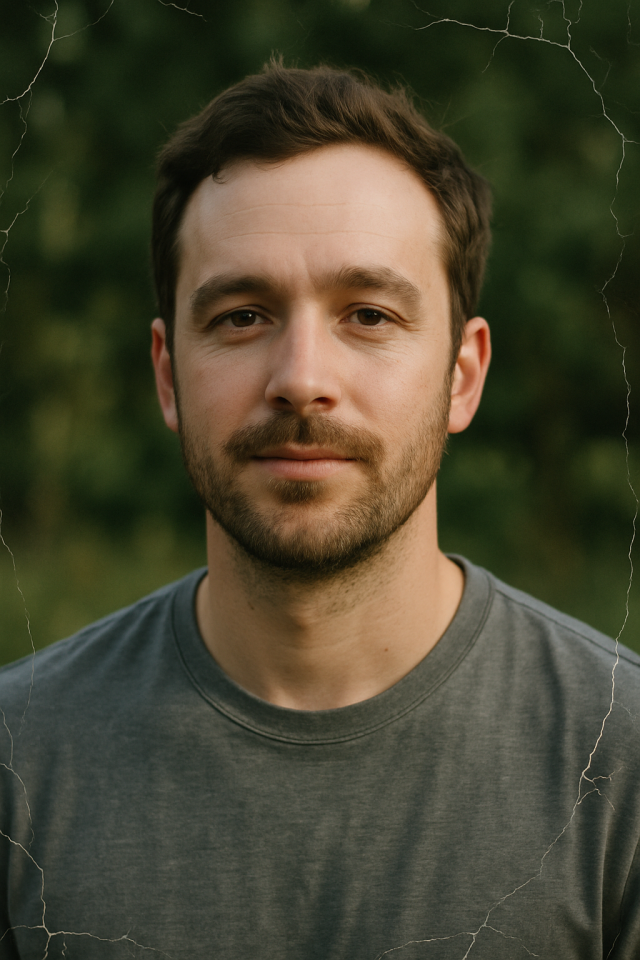

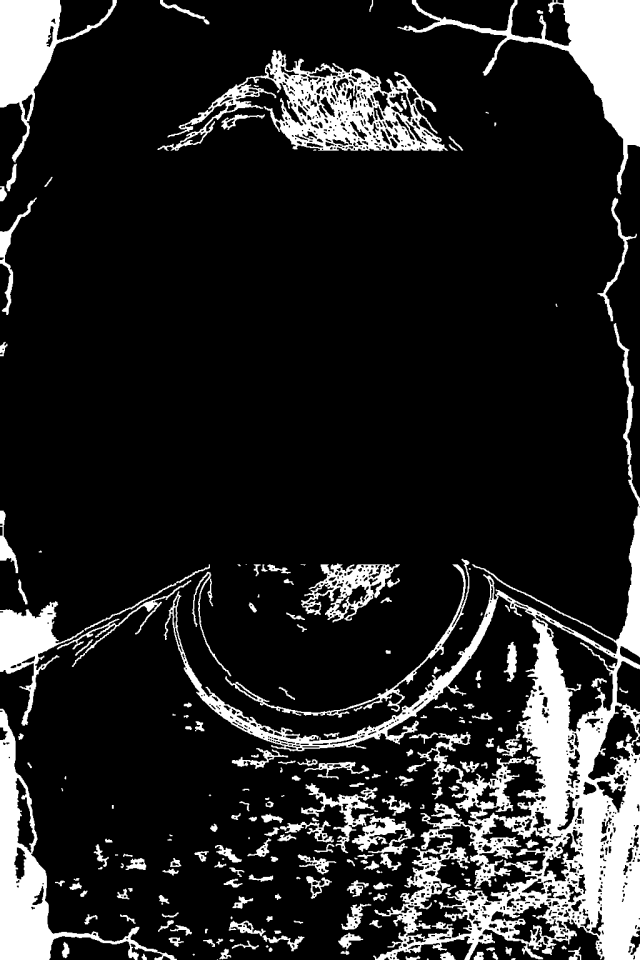

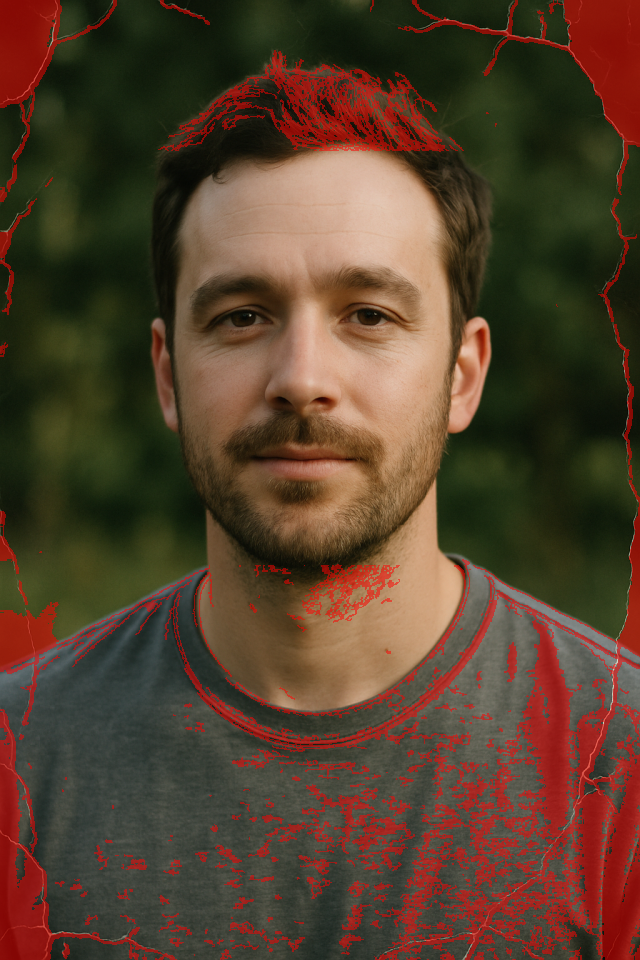

Inpainting with radius: 1.5
Displaying repaired (PIL fallback)...


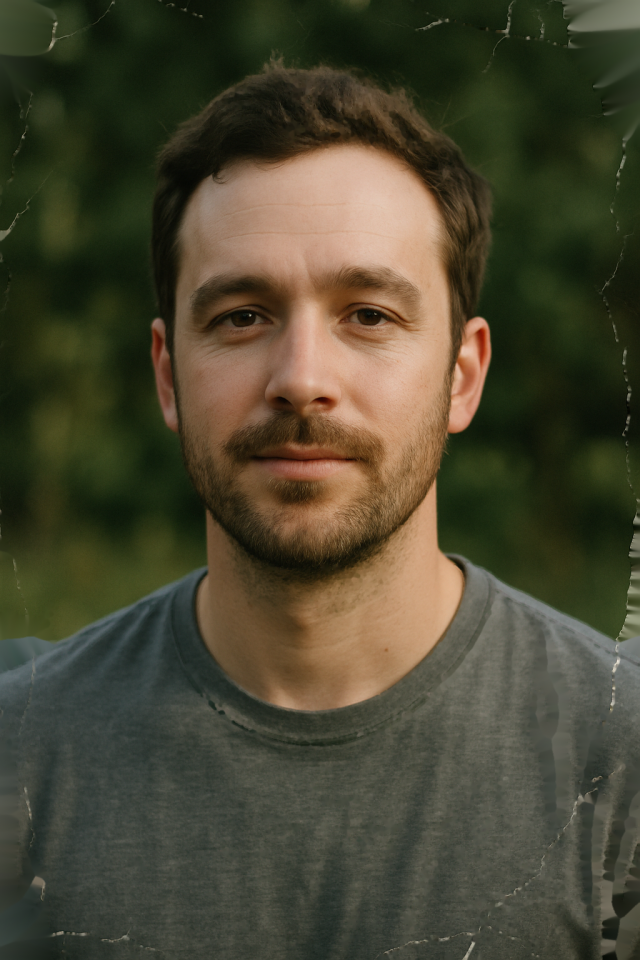

Saved repaired image to: c:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch\outputs\High Quality1_repaired.png
Mask used: c:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch\outputs\masks\High Quality1_mask.png


In [5]:
## 5) OpenCV inpainting demo (per-image mask)

import numpy as np
import cv2

print('Demo: OpenCV inpainting with intelligent mask detection')

# Use the configured image path from cell 3
img_path = INPUT_IMAGE_PATH
print(f'Input image: {img_path}')

base = img_path.stem
orig = load_bgr(img_path)

# STEP 1: Check if the image itself has red markings (manual marking)
red_mask = extract_red_mask(orig, hue_min=0, hue_max=10, sat_min=100, val_min=100)
red_coverage = red_mask.mean() / 255.0

if red_coverage > 0.01:  # If more than 1% is red-marked
    print(f'✓ Detected RED MANUAL MARKINGS in image (coverage: {red_coverage:.2%})')
    print('  → Using red-marked areas as mask (manual markings should be repaired EVERYWHERE, including faces)')
    mask = red_mask
    mask_used = 'Red markings detected in image (no face exclusion)'
else:
    # STEP 2: Look for pre-saved mask files
    print('✗ No red markings detected in image')
    mask_candidates = [
        (MASKS_OUT / f'{base}_mask.png'),
        (PROJECT_ROOT / 'masks' / f'{base}_mask.png'),
        img_path.with_name(base + '_mask.png'),
    ]
    mask_path = next((p for p in mask_candidates if p.exists()), None)
    
    if mask_path is not None and mask_path.exists():
        # Use existing mask file
        mask = load_gray(mask_path)
        mask_used = str(mask_path)
        print(f'✓ Found existing mask file: {mask_used}')
    else:
        # STEP 3: Auto-generate mask (only if no manual marking and no saved mask)
        print('✗ No mask file found')
        print('  → Auto-generating enhanced crack mask for old photos...')
        print('  ℹ  Face exclusion enabled (only for auto-generated masks to preserve natural facial features)')
        
        # Use the new enhanced detection method
        mask = generate_old_photo_crack_mask(orig, exclude_faces=True)
        
        # Optional: combine with other methods for better coverage
        m_ms = generate_crack_mask_multiscale_auto(orig, target_min_ratio=0.002, target_max_ratio=0.06, exclude_faces=True)
        mask = cv2.bitwise_or(mask, m_ms)
        
        # Final cleanup
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((2, 2), np.uint8), iterations=1)
        
        gen_path = MASKS_OUT / f'{base}_mask.png'
        cv2.imwrite(str(gen_path), mask)
        mask_used = f'Auto-generated (enhanced): {gen_path}'
        print(f'✓ Generated enhanced mask: {gen_path}')

coverage = mask.mean() / 255.0
print(f'Original shape: {orig.shape} | Mask shape: {mask.shape} | Coverage: {coverage:.4f}')

# Ensure mask matches input size
if mask.shape[:2] != orig.shape[:2]:
    print(f'Resizing mask from {mask.shape} to match image {orig.shape[:2]}')
    mask = cv2.resize(mask, (orig.shape[1], orig.shape[0]), interpolation=cv2.INTER_NEAREST)

# Visualize inputs + overlay (PIL fallback is used if matplotlib is unavailable)
orig_small = resize_max_dim(orig, 960)
mask_vis = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
mask_vis = resize_max_dim(mask_vis, 960)
over = overlay_mask(orig_small, cv2.resize(mask, (orig_small.shape[1], orig_small.shape[0]), interpolation=cv2.INTER_NEAREST))

if _PIL_AVAILABLE and Image is not None:
    print('Displaying original, mask, and overlay (PIL fallback)...')
    display(bgr_to_pil(orig_small))
    display(bgr_to_pil(mask_vis))
    display(bgr_to_pil(over))
else:
    show_bgr(orig_small, 'Original (small)')
    show_bgr(mask_vis, 'Mask (small)')
    show_bgr(over, 'Overlay (small)')

# Inpaint with appropriate radius (larger for manual marks, smaller for auto-detected cracks)
inpaint_radius = 3 if red_coverage > 0.01 else 1.5
print(f'Inpainting with radius: {inpaint_radius}')
repaired = cv2.inpaint(orig, mask, inpaintRadius=inpaint_radius, flags=cv2.INPAINT_TELEA)
rep_small = resize_max_dim(repaired, 960)

if _PIL_AVAILABLE and Image is not None:
    print('Displaying repaired (PIL fallback)...')
    display(bgr_to_pil(rep_small))
else:
    show_bgr(rep_small, 'Repaired (OpenCV)')

# Save result with per-image basename
out_path = OUTPUT_FOLDER / f'{base}_repaired.png'
save_bgr(out_path, repaired)
print(f'Saved repaired image to: {out_path}')
print(f'Mask used: {mask_used}')


## 🎨 Background Removal

Remove backgrounds from photos using AI models (rembg) or OpenCV's GrabCut.

**Available Methods:**
- **rembg + u2net**: Best quality, uses pretrained deep learning model
- **rembg + u2net_human_seg**: Optimized for people/portraits
- **GrabCut**: No external models needed, fully OpenCV-based (less accurate)

BACKGROUND REMOVAL DEMO

📷 Loading: High Quality1.png
Image size: 1024x1536


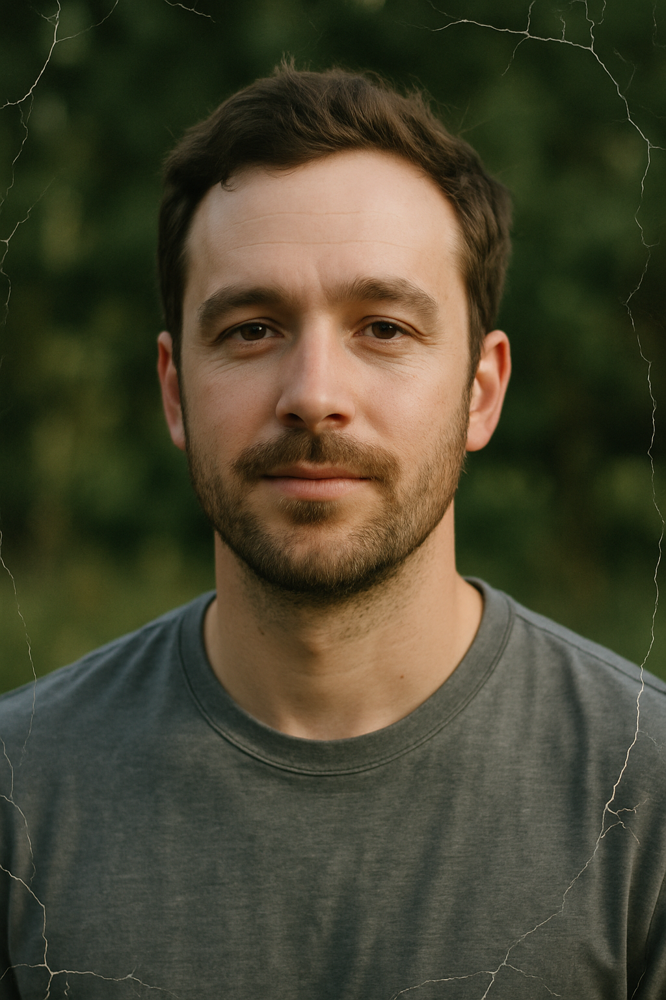


🤖 Attempting background removal with AI model (rembg)...
⚠ rembg not installed. Install with: pip install rembg

🔄 Falling back to OpenCV GrabCut...
✓ Background removed using GrabCut (5 iterations)


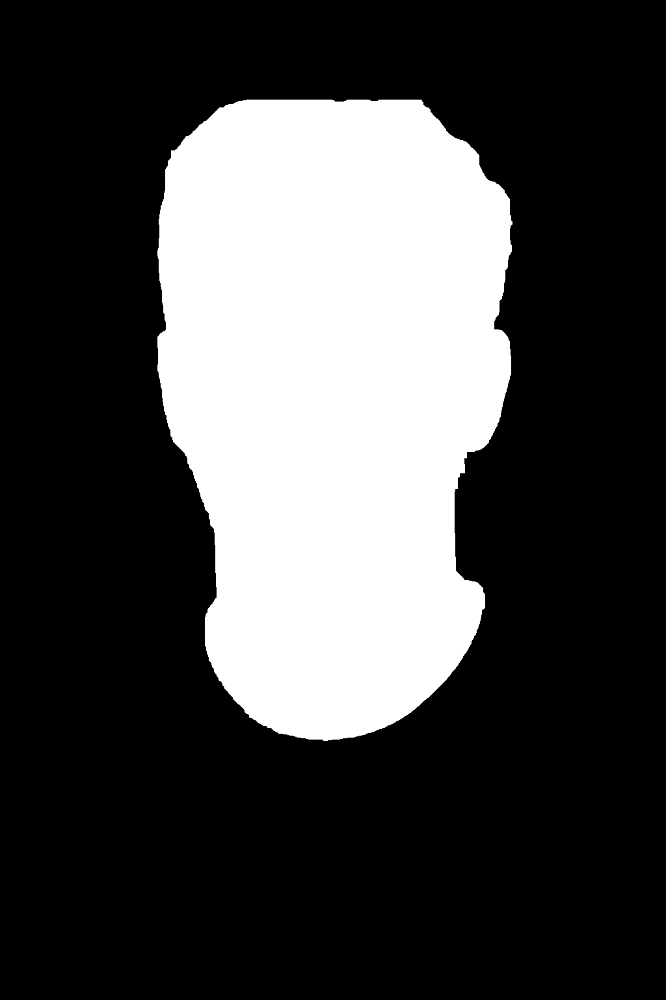


✨ Result with transparent background:


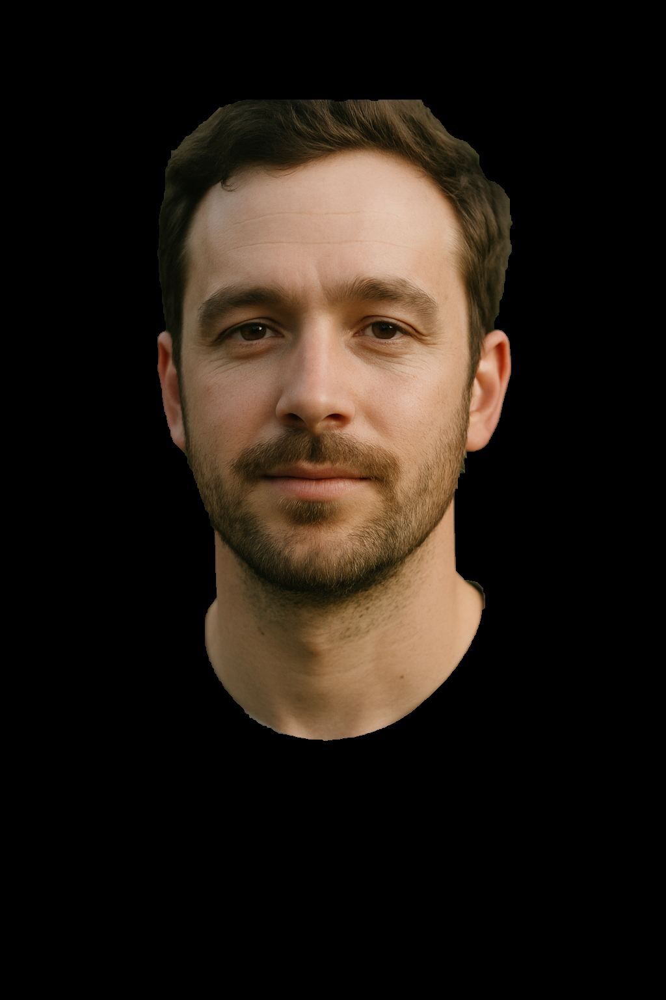

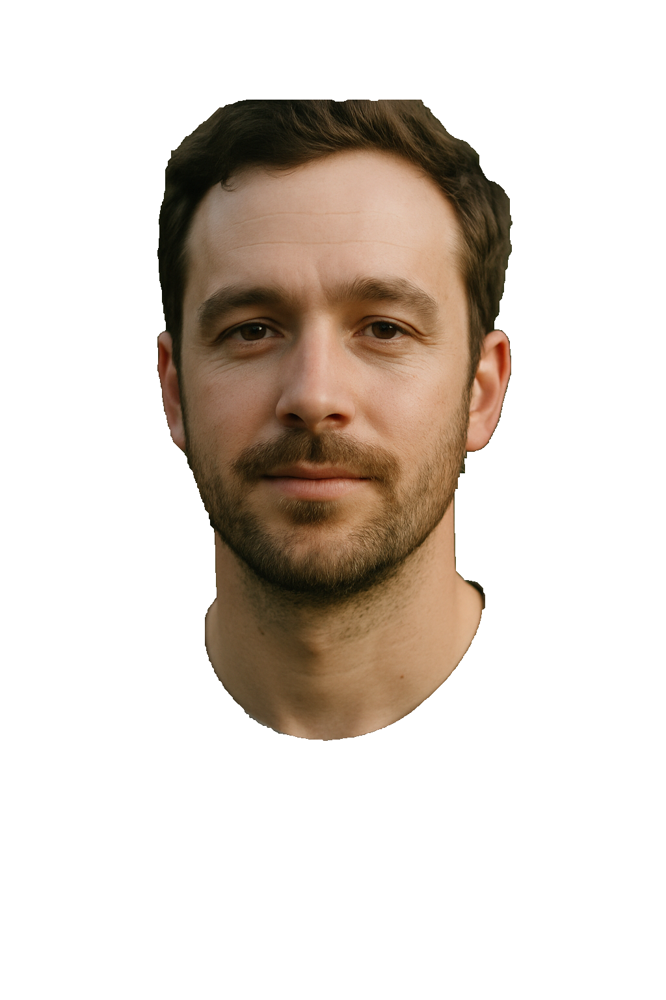

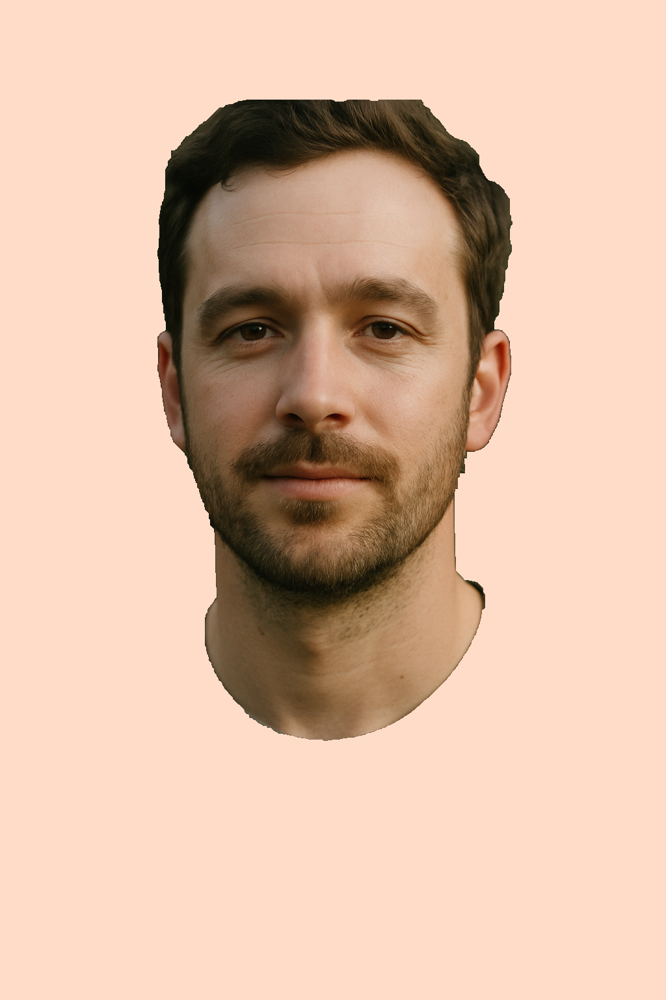

✓ Saved transparent PNG to: c:\Users\jashu\Downloads\Image Restoration - CV\Repairing-Old-Photos-with-OpenCV-from-scratch\outputs\background_removed\High Quality1_nobg.png

✅ Background removal complete!
Coverage: 27.4% foreground


In [6]:
## Background Removal Demo

print('=' * 60)
print('BACKGROUND REMOVAL DEMO')
print('=' * 60)

# Load image
img_path = INPUT_IMAGE_PATH
print(f'\n📷 Loading: {img_path.name}')
original = load_bgr(img_path)

# Display original
print(f'Image size: {original.shape[1]}x{original.shape[0]}')
show_bgr(original, 'Original Image', figsize=(6, 6))

# Try rembg first (best quality)
print('\n🤖 Attempting background removal with AI model (rembg)...')
bgra_result, mask = remove_background_rembg(original, model_name='u2net')

# Fallback to GrabCut if rembg not available
if bgra_result is None:
    print('\n🔄 Falling back to OpenCV GrabCut...')
    bgra_result, mask = remove_background_grabcut(original, iterations=5)

if bgra_result is not None:
    # Show mask
    show_bgr(mask, 'Foreground Mask', figsize=(6, 6))
    
    # Show result on transparent background
    print('\n✨ Result with transparent background:')
    show_bgr(bgra_result, 'Transparent Background', figsize=(6, 6))
    
    # Show result on white background
    white_bg = composite_on_background(bgra_result, bg_color=(255, 255, 255))
    show_bgr(white_bg, 'On White Background', figsize=(6, 6))
    
    # Show result on colored background
    color_bg = composite_on_background(bgra_result, bg_color=(200, 220, 255))  # Light blue
    show_bgr(color_bg, 'On Colored Background', figsize=(6, 6))
    
    # Save outputs
    base_name = img_path.stem
    output_folder = OUTPUT_FOLDER / 'background_removed'
    
    # Save transparent PNG
    transparent_path = output_folder / f'{base_name}_nobg.png'
    save_transparent_png(bgra_result, transparent_path)
    
    # Save white background version
    white_path = output_folder / f'{base_name}_white_bg.png'
    save_bgr(white_path, white_bg)
    
    print(f'\n✅ Background removal complete!')
    print(f'Coverage: {np.sum(mask > 0) / mask.size * 100:.1f}% foreground')
else:
    print('\n❌ Background removal failed. Please install rembg:'
          '\n   pip install rembg onnxruntime')